In [124]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from copy import deepcopy
from tensorflow import keras
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

In [125]:
!pip install opencv-python
!pip install tabulate

# **Part 1**

**Apply PCA. How many components do you need to preserve 95% of the variance?**



*   Here I'm using the MNIST dataset which I'm importing form Keras.
*   I'm just considering the first 5000 images for train dataste  from x_tain.
*  While I'm using 1000 images for validation dataste which I take from x_test.

In [126]:
(x_train, y_train), (x_test, y_test) = keras.datasets.mnist.load_data()

In [127]:
x_train, y_train, x_valid, y_valid = x_train[:5000], y_train[:5000],x_test[:1000], y_test[:1000]

In [128]:
x_train.shape

(5000, 28, 28)

In [129]:
y_valid.shape

(1000,)

In [130]:
x_train_flattened = x_train.reshape(x_train.shape[0], -1)

In [131]:
x_train_flattened.shape

(5000, 784)

In [132]:
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x_train_flattened)

In [133]:
pca = PCA(0.95)
X_reduced = pca.fit_transform(x_scaled)

In [134]:
desired_variance = 0.95
cumulative_variance_ratio = np.cumsum(pca.explained_variance_ratio_)
num_components = np.argmax(cumulative_variance_ratio >= desired_variance) + 1

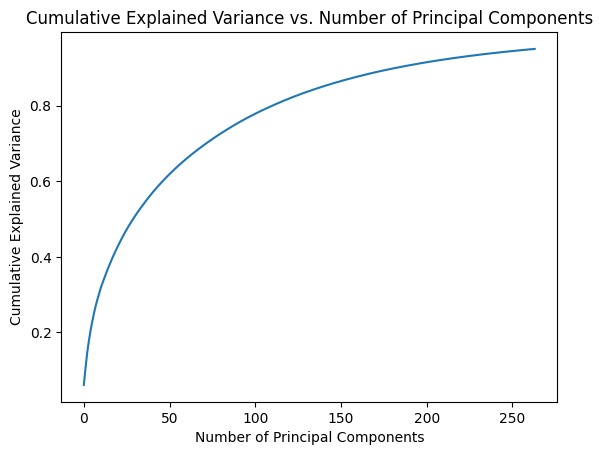

In [135]:
cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)

# Plot the Cumulative Explained Variance
plt.plot(cumulative_explained_variance)
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance vs. Number of Principal Components')
plt.show()

In [136]:
cumulative_explained_variance

array([0.06120767, 0.10657995, 0.14734482, 0.17907866, 0.20704628,
       0.23067697, 0.25229948, 0.27162585, 0.28855637, 0.3043422 ,
       0.31925521, 0.33212056, 0.34433796, 0.35646403, 0.36827125,
       0.37933389, 0.39018555, 0.40070266, 0.4106888 , 0.42037227,
       0.42961098, 0.43865885, 0.44765301, 0.45633283, 0.46459273,
       0.47257655, 0.48029296, 0.48764339, 0.4949389 , 0.50194837,
       0.50886653, 0.5155347 , 0.52205518, 0.52838925, 0.53456798,
       0.54069384, 0.54675962, 0.55261587, 0.55840855, 0.56404156,
       0.56961719, 0.57500641, 0.58028011, 0.58551609, 0.59054297,
       0.59547064, 0.60033197, 0.60513725, 0.60984702, 0.61447955,
       0.61896851, 0.62342666, 0.62778856, 0.63209916, 0.63635489,
       0.64049339, 0.64457833, 0.64861715, 0.65259034, 0.65644357,
       0.66024045, 0.66402752, 0.66774199, 0.67142142, 0.67501976,
       0.67857015, 0.68207874, 0.68551413, 0.68891484, 0.69230445,
       0.69561973, 0.69892748, 0.7021691 , 0.70536561, 0.70854

In [137]:
X_reduced.shape

(5000, 264)

In [138]:
X_reduced

array([[-1.18381765, -4.74664945, -0.6176446 , ...,  0.14360715,
         0.14386761, -0.09048586],
       [ 8.34200551, -7.06693129, -5.27951203, ...,  0.05633176,
         0.47634134, -0.07873674],
       [ 2.63748111, 10.66214696, -3.53852244, ..., -0.48393011,
        -0.53859252,  0.12850458],
       ...,
       [ 3.2895163 , -3.66278874,  1.74879453, ...,  0.44521351,
         0.08866188,  0.17606295],
       [-7.27187442, -0.81901285,  2.35290875, ..., -0.10993829,
         0.81312964,  0.14054199],
       [-1.33320447,  1.59472758,  6.41912983, ...,  0.10079196,
         0.80761185,  0.44503517]])

In [139]:
x_train.shape

(5000, 28, 28)

In [140]:
num_components

264

<b> <i>  This clearly shows that 264 Components are required to preserve 95% of the cumulative explained variance. The horizontal red dashed line marks the 95% threshold, and the vertical red dashed line indicates the number of components required to reach at least 95% cumulative variance.


# **Part 2**

**Plot 10 images of your choice in the original form (without PCA) and then plot their reconstruction (projection in the original space) after you kept 95% of variance using PCA**

In [141]:
pca_ = PCA(0.95)
X_preduced = pca_.fit_transform(x_scaled, y_train)
X_precovered = pca_.inverse_transform(X_preduced)

In [142]:

images_standardized = scaler.fit_transform(x_train_flattened[:10])

# Apply PCA
pca = PCA(n_components=0.95)
images_pca = pca.fit_transform(images_standardized)

# Reconstruct images
reconstructed_images = pca.inverse_transform(images_pca)

# Reshape reconstructed images to original shape
reconstructed_images = reconstructed_images.reshape(10, *(28,28))

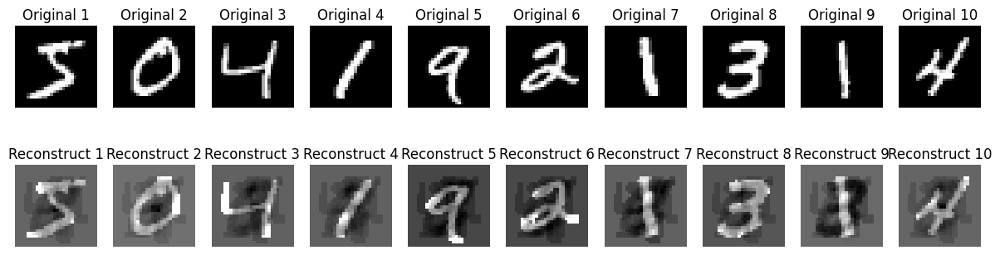

In [143]:
fig, axes = plt.subplots(2, 10, figsize=(15, 4))
for i in range(10):
    axes[0, i].imshow(x_train[i], cmap='gray')
    axes[0, i].axis('off')
    axes[0, i].set_title(f'Original {i+1}')
    axes[1, i].imshow(reconstructed_images[i], cmap='gray')
    axes[1, i].axis('off')
    axes[1, i].set_title(f'Reconstruct {i+1}')

As you can see above is the plot of 10 original images and their reconstructions.

# **Part 3**

**Each of the images belongs to one of 10 digit categories. The category is indicated by the first letter in the filename. We will now try to see if the visualization can help us identify different clusters.**

**A. Use PCA to reduce dimensionality to only 2 dimensions. How much of the variance is explained with the first two principal components?**


In [189]:
print(f"Explained variance ratio for the first two components: {pca.explained_variance_ratio_}")

Explained variance ratio for the first two components: [0.09867566 0.07404546]


Explained variance by the first component: 9.867%

Explained variance by the second component: 7.404%



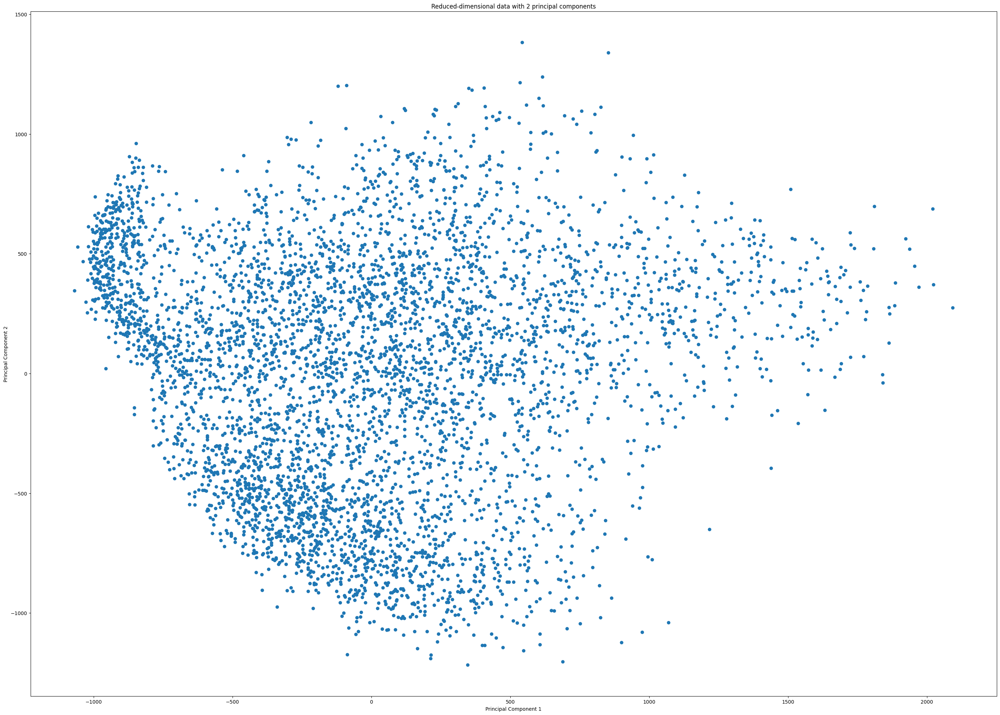

In [190]:
# Plot the reduced-dimensional data
plt.figure(figsize=(35, 25))
plt.scatter(X_reduced[:, 0], X_reduced[:, 1])
plt.title('Reduced-dimensional data with 2 principal components')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

In [191]:
pca.explained_variance_ratio_.sum()

0.17272112050931016

Total explained variance by the first two components: 17.272%

**B. Plot a 2D scatter plot of the images spanned by the first two principal components. Each image will be represented with a dot. Make the color of the dot correspond to the image category (so you will have three different colors). Then add some rock images to the visualization to better understand what features in the images are accounting for the majority of variance in the data. Repeat the process and create the same type of plots for t-SNE, LLE and MDS.**

In [147]:
from sklearn.preprocessing import MinMaxScaler
from matplotlib.offsetbox import AnnotationBbox, OffsetImage

def plot_digits(X, y, min_distance=0.04, images=None, figsize=(13, 10)):
    # Let's scale the input features so that they range from 0 to 1
    X_normalized = MinMaxScaler().fit_transform(X)
    # Now we create the list of coordinates of the digits plotted so far.
    # We pretend that one is already plotted far away at the start, to
    # avoid `if` statements in the loop below
    neighbors = np.array([[10., 10.]])
    # The rest should be self-explanatory
    plt.figure(figsize=figsize)
    cmap = plt.cm.jet
    digits = np.unique(y)
    for digit in digits:
        plt.scatter(X_normalized[y == digit, 0], X_normalized[y == digit, 1],
                    c=[cmap(float(digit) / 9)], alpha=0.5)
    plt.axis("off")
    ax = plt.gca()  # get current axes
    for index, image_coord in enumerate(X_normalized):
        closest_distance = np.linalg.norm(neighbors - image_coord, axis=1).min()
        if closest_distance > min_distance:
            neighbors = np.r_[neighbors, [image_coord]]
            if images is None:
                plt.text(image_coord[0], image_coord[1], str(int(y[index])),
                         color=cmap(float(y[index]) / 9),
                         fontdict={"weight": "bold", "size": 16})
            else:
                image = images[index].reshape(28, 28)
                imagebox = AnnotationBbox(OffsetImage(image, cmap="binary"),
                                          image_coord)
                ax.add_artist(imagebox)

#PCA

Following are plots for data after using PCA to reduce the dimensionality to 2. While the first one is just with data points, the second has some images of corresponding category labels with it.

In [148]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
%time X_reduced = pca.fit_transform(x_train_flattened[:5000])

CPU times: user 257 ms, sys: 171 ms, total: 427 ms
Wall time: 347 ms


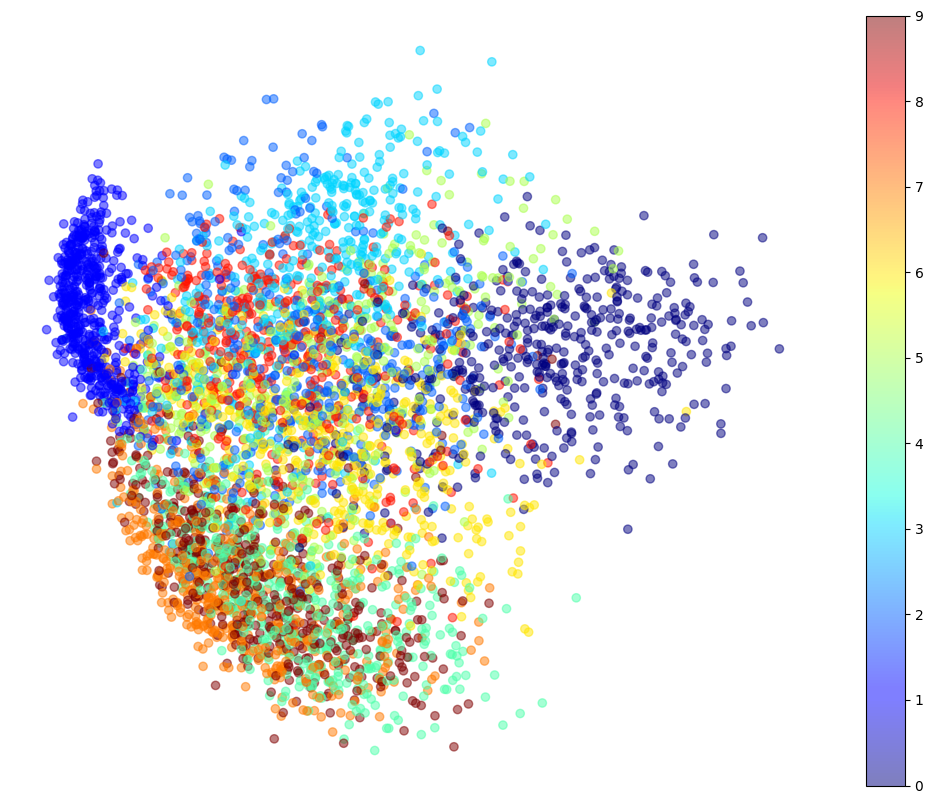

In [149]:
plt.figure(figsize=(13, 10))
plt.scatter(X_reduced[:, 0], X_reduced[:, 1],
            c=y_train[:5000].astype(np.int8), cmap="jet", alpha=0.5)
plt.axis('off')
plt.colorbar()
plt.show()

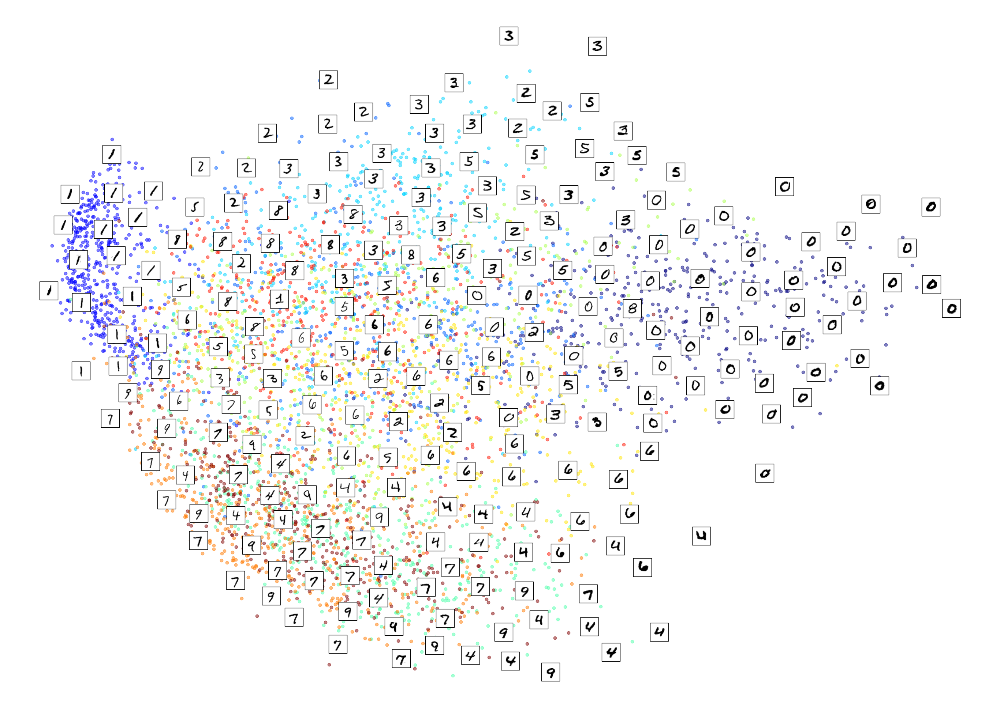

In [150]:
plot_digits(X_reduced, y_train, images=x_train, figsize=(35, 25))

#LLE

Following are plots for data after using LLE to reduce the dimensionality to 2. While the first one is just with data points, the second has some images of corresponding category labels with it.

In [151]:
from sklearn.manifold import LocallyLinearEmbedding

lle = LocallyLinearEmbedding(n_components=2, random_state=42)
%time X_reduced_lle  = lle.fit_transform(x_train_flattened[:5000])

CPU times: user 5.53 s, sys: 2.5 s, total: 8.03 s
Wall time: 12.5 s


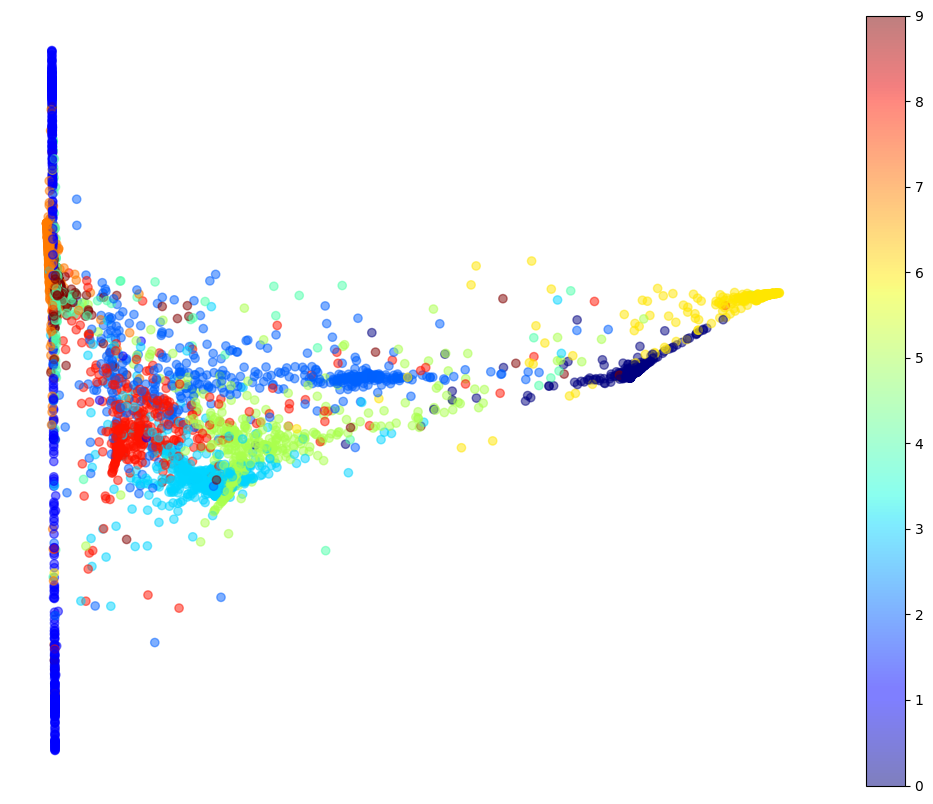

In [152]:
plt.figure(figsize=(13, 10))
plt.scatter(X_reduced_lle[:, 0], X_reduced_lle[:, 1],
            c=y_train[:5000].astype(np.int8), cmap="jet", alpha=0.5)
plt.axis('off')
plt.colorbar()
plt.show()

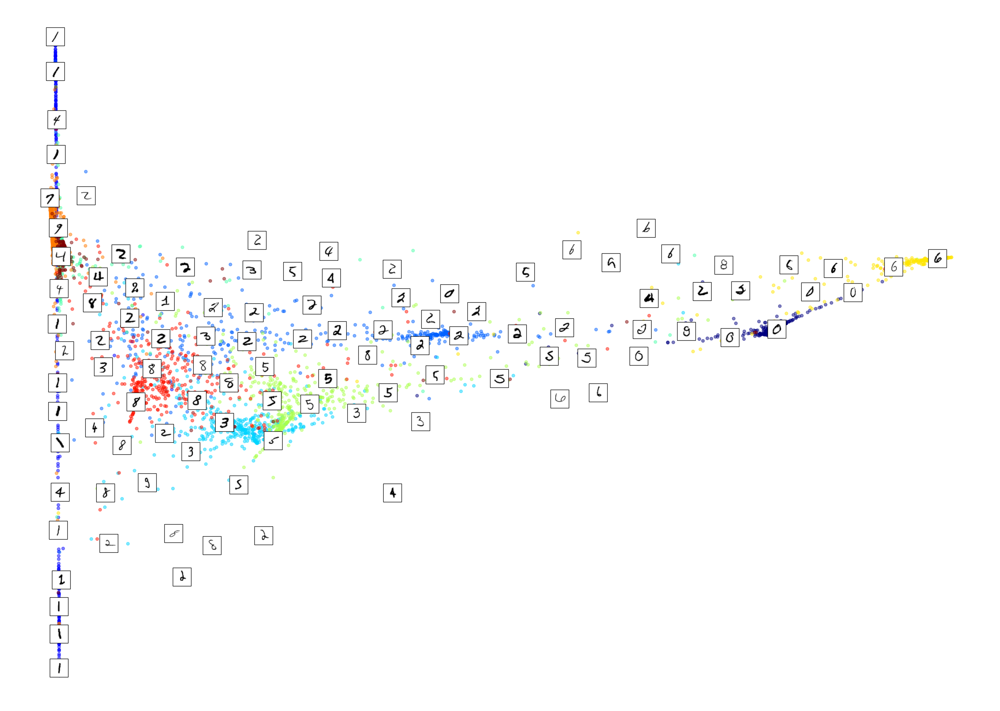

In [153]:
plot_digits(X_reduced_lle, y_train, images=x_train, figsize=(35, 25))

#TSNE

Following are plots for data after using TSNE to reduce the dimensionality to 2. While the first one is just with data points, the second has some images of corresponding category labels with it.

In [154]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, init="random", learning_rate="auto",
            random_state=42)
%time X_reduced_tsne  = tsne.fit_transform(x_train_flattened[:5000])

CPU times: user 1min 24s, sys: 110 ms, total: 1min 25s
Wall time: 1min 12s


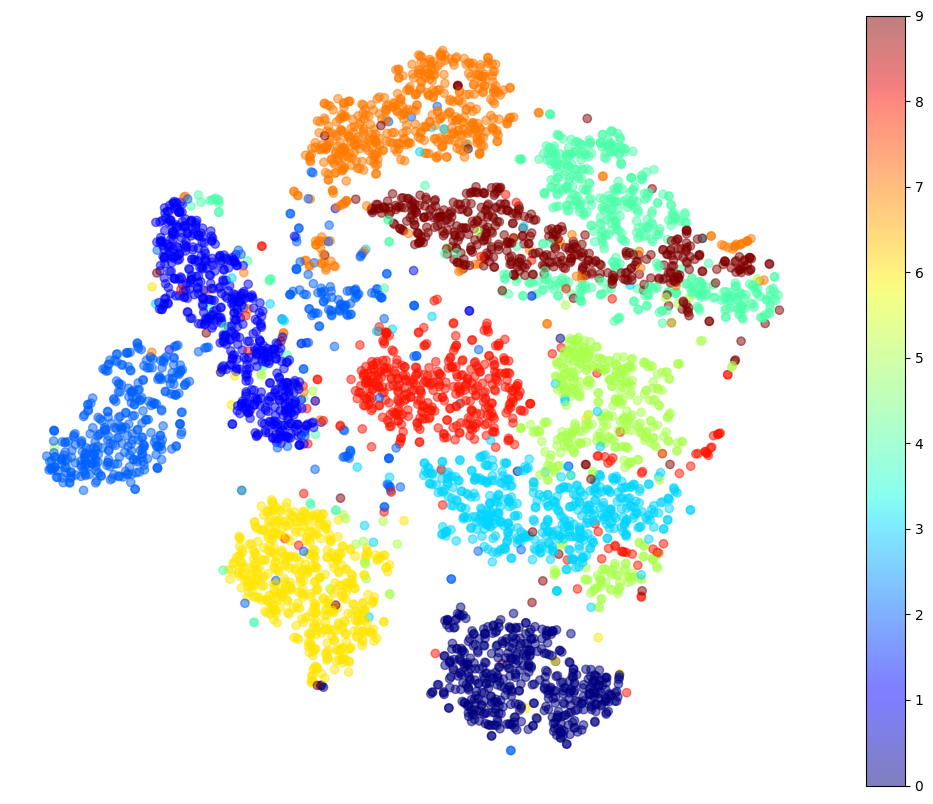

In [155]:
plt.figure(figsize=(13, 10))
plt.scatter(X_reduced_tsne[:, 0], X_reduced_tsne[:, 1],
            c=y_train[:5000].astype(np.int8), cmap="jet", alpha=0.5)
plt.axis('off')
plt.colorbar()
plt.show()

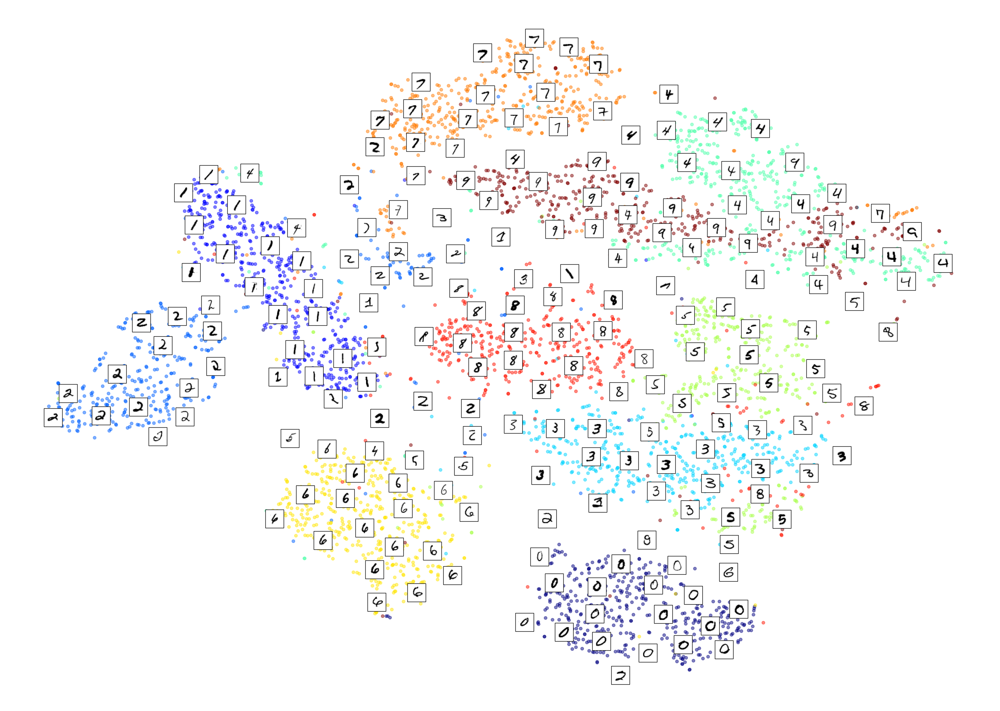

In [156]:
plot_digits(X_reduced_tsne, y_train, images=x_train, figsize=(35, 25))

#MDS

Following are plots for data after using MDS to reduce the dimensionality to 2. While the first one is just with data points, the second has some images of corresponding category labels with it.

In [157]:
from sklearn.manifold import MDS

mds = MDS(n_components=2, normalized_stress=False, random_state=42)
%time X_reduced_mds  = mds.fit_transform(x_train_flattened)

CPU times: user 9min 49s, sys: 5min 43s, total: 15min 33s
Wall time: 12min 22s


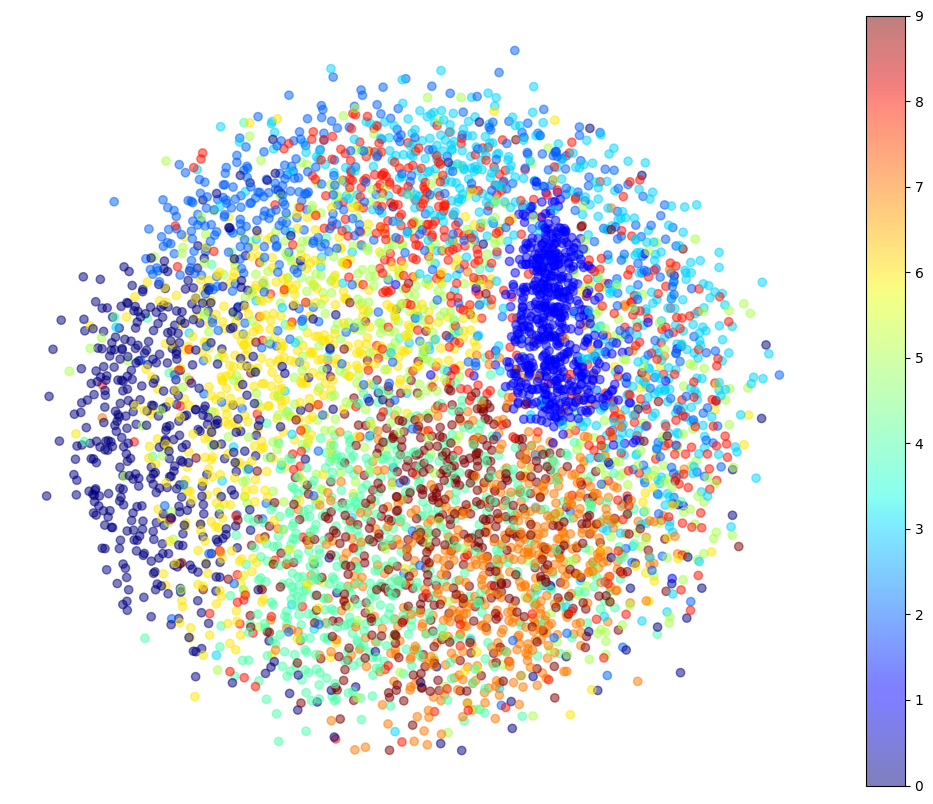

In [158]:
plt.figure(figsize=(13, 10))
plt.scatter(X_reduced_mds[:, 0], X_reduced_mds[:, 1],
            c=y_train[:5000].astype(np.int8), cmap="jet", alpha=0.5)
plt.axis('off')
plt.colorbar()
plt.show()

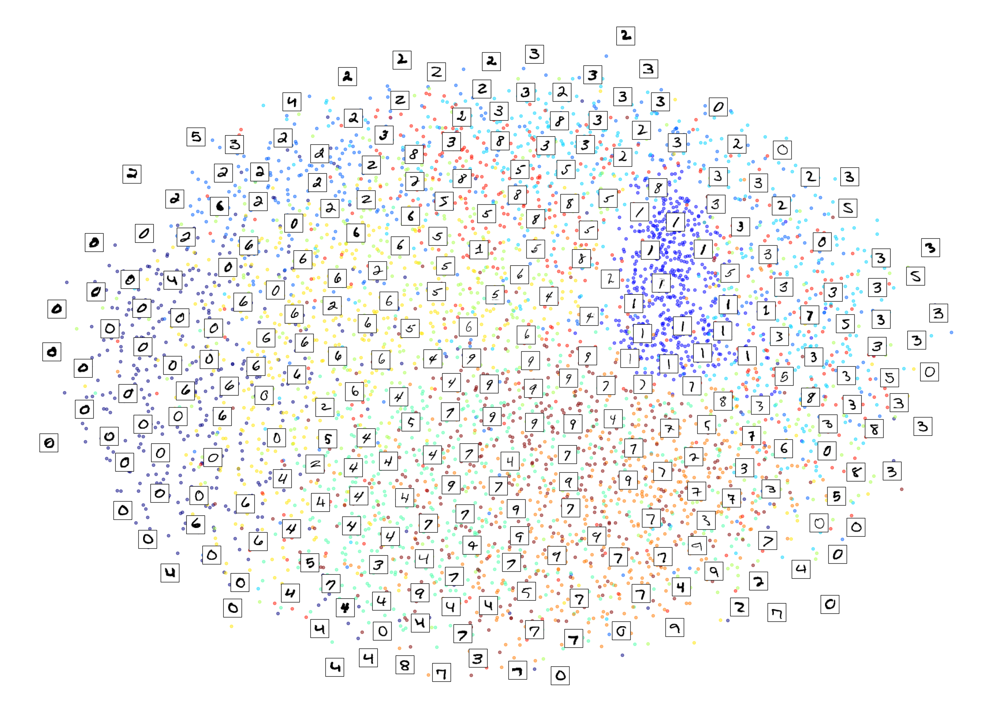

In [159]:
plot_digits(X_reduced_mds, y_train, images=x_train, figsize=(35, 25))

**C. Which of the visualizations do you prefer?**

Based on the provided visualizations from PCA, LLE, t-SNE, and MDS algorithms, each plot offers a different perspective on the dataset:

**PCA (Principal Component Analysis):**

PCA tends to preserve global distances between points and is good at highlighting large-scale structure in the data. However, it may not always capture the local structure as effectively, which can be essential for classifying similar objects.

**LLE (Locally Linear Embedding):**

LLE is more focused on preserving local distances, and therefore, it might be better at clustering local groups of data points. In your LLE plot, the categories seem to be slightly more clustered than in PCA, but there is still some overlap.

**t-SNE (t-Distributed Stochastic Neighbor Embedding):**

t-SNE is particularly good at preserving local structure and is known for its ability to separate clusters in a more distinct manner. The t-SNE plot shows separated clusters, but some overlap remains.

**MDS (Multidimensional Scaling):**

MDS aims to preserve the distance between points, similar to PCA, but it uses a slightly different approach. It is more focused on visualizing the similarity of individual cases in a dataset.

From a classification perspective, the algorithm that results in the best-separated clusters of points, corresponding to the different handwritten digit types, would be the most useful. Based on the scatter plots alone and without additional quantitative analysis, t-SNE seems to provide the most distinct separation among the 10 digit categories. However, the effectiveness of each method can vary with different datasets and hyperparameter settings, so it is often recommended to evaluate the classification performance with actual supervised learning algorithms to determine the best method for the specific task.

The t-SNE visualization is often considered the best among the dimensionality reduction techniques for classifying complex datasets with non-linear structures because:

t-SNE is adept at creating a two-dimensional map that reveals the intrinsic structure of the data at many different scales, which is often very effective for visualizing high-dimensional data. It excels at maintaining the local structure of the data, meaning that points which are close in the high-dimensional space will likely be close in the 2D map as well. t-SNE tends to expand dense clusters and contract sparse ones, allowing for clearer visual separation if such clusters exist in the data. In the context of your dataset, the t-SNE plot appears to show clearer separation between different categories than PCA, LLE, and MDS. This suggests that the local structures within your data are quite distinct, and t-SNE is effectively bringing those to light, which can be especially useful for classification tasks.

# **Part 5**

**Cluster the images using K-Means**

**A. To speed up the algorithm, use PCA to reduce the dimensionality of the dataset to two. Determine the number of clusters using one of the techniques we discussed in class**

I'll be using the TSNE reduction as it had the best separation between different categories. If I use the PCA the clusters are all merged into one another

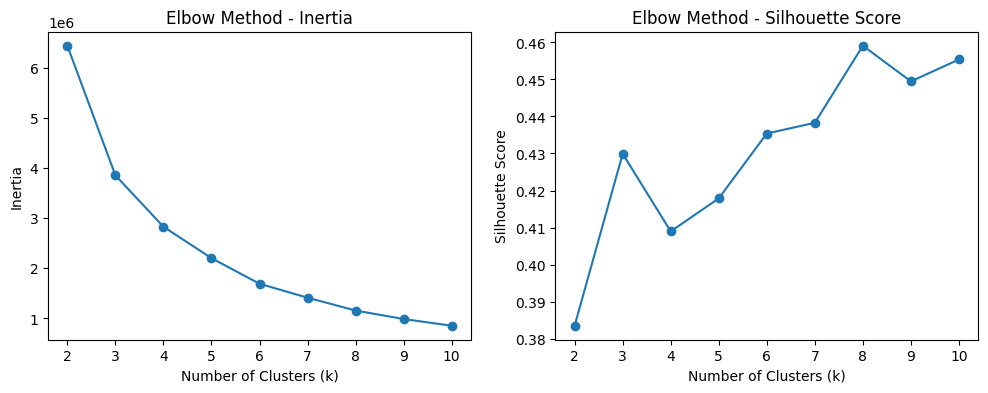

In [160]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

# Assuming X_reduced is your reduced feature matrix
inertia_values = []
silhouette_scores = []
possible_k_values = range(2, 11)

for k in possible_k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_reduced_tsne[:5000])
    inertia_values.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_reduced_tsne[:5000], kmeans.labels_))

# Plot the Elbow method
plt.figure(figsize=(12, 4))

# Plot Inertia values
plt.subplot(1, 2, 1)
plt.plot(possible_k_values, inertia_values, marker='o')
plt.title('Elbow Method - Inertia')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')

# Plot Silhouette scores
plt.subplot(1, 2, 2)
plt.plot(possible_k_values, silhouette_scores, marker='o')
plt.title('Elbow Method - Silhouette Score')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')

plt.show()



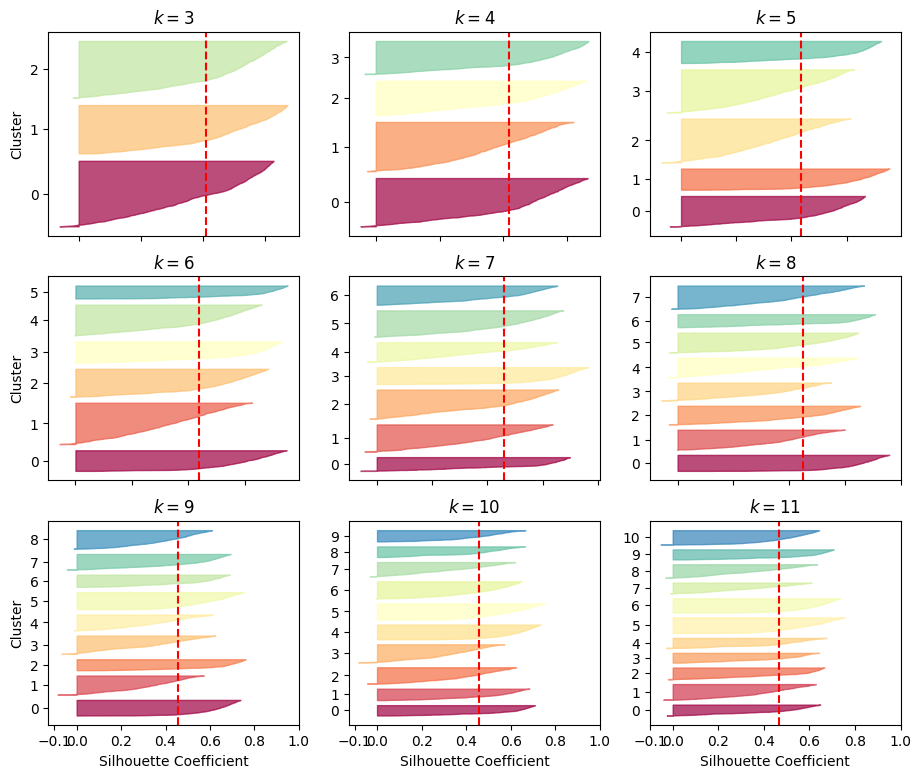

In [161]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedLocator, FixedFormatter

# Assuming X_pca is defined and is your dataset reduced to principal components

# Train KMeans for different values of k
kmeans_per_k = [KMeans(n_clusters=k, random_state=42).fit(X_reduced_tsne) for k in range(3, 13)]

# Calculate silhouette scores for each k
silhouette_scores = [silhouette_samples(X_reduced_tsne, model.labels_) for model in kmeans_per_k]

# Plotting the silhouette diagrams
plt.figure(figsize=(11, 9))

for k in range(3, 12):
    plt.subplot(3, 3, k - 2)

    y_pred = kmeans_per_k[k - 2].labels_
    silhouette_coefficients = silhouette_scores[k - 2]

    padding = len(X_reduced_tsne) // 30
    pos = padding
    ticks = []
    for i in range(k):
        coeffs = silhouette_coefficients[y_pred == i]
        coeffs.sort()

        color = plt.cm.Spectral(i / k)
        plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                          facecolor=color, edgecolor=color, alpha=0.7)
        ticks.append(pos + len(coeffs) // 2)
        pos += len(coeffs) + padding

    plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
    plt.gca().yaxis.set_major_formatter(FixedFormatter(range(k)))
    if k in (3, 6,9):
        plt.ylabel("Cluster")

    if k in (9, 10,11):
        plt.gca().set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
        plt.xlabel("Silhouette Coefficient")
    else:
        plt.tick_params(labelbottom=False)

    plt.axvline(x=np.mean(silhouette_coefficients), color="red", linestyle="--")
    plt.title(f"$k={k}$")

plt.show()

As you can see, k = 10 looks like the best option here, as all clusters are roughly the same size, and they all cross the dashed line, which represents the mean silhouette score. Which is also clear from the Elbow Method graph if Inertia and Silhouette Score

**B. Visualize the clusters in a similar way to the visualization after line 28 here: https://github.com/ageron/handson-ml3/blob/main/09_unsupervised_learning.ipynbLinks to an external site., but color each dot based on the clusters it belongs to using the labels taken from the filename as in question**

Following is the visualisation of k-means

In [162]:
# Assuming n_clusters is the determined number of clusters
kmeans = KMeans(n_clusters=10, random_state=42)
kmeans.fit(X_reduced_tsne)
labels = kmeans.labels_

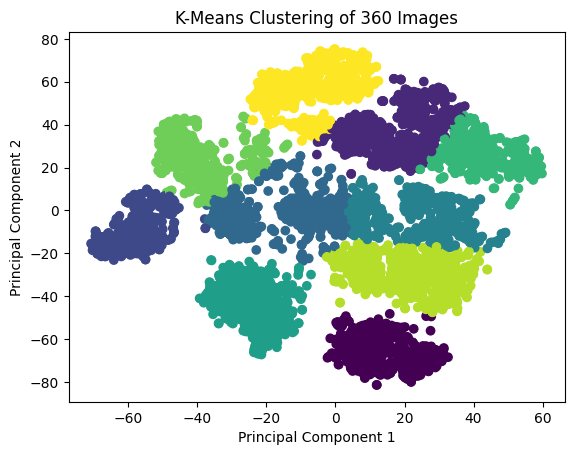

In [163]:
plt.scatter(X_reduced_tsne[:, 0], X_reduced_tsne[:, 1], c=labels, cmap='viridis')
plt.title('K-Means Clustering of 360 Images')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()


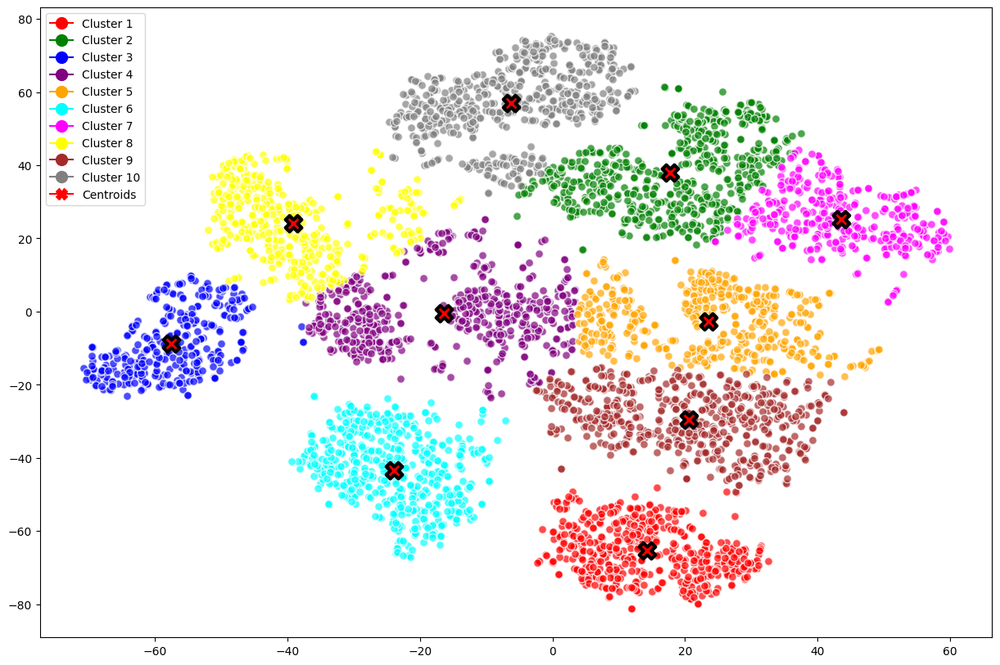

In [164]:
# Train a KMeans model
kmeans = KMeans(n_clusters=10, random_state=42)
kmeans.fit(X_reduced_tsne)
categories = kmeans.labels_
centroids = kmeans.cluster_centers_

# Create a mapping of category to color with full names for the legend
category_colors = {
    0: 'red', 1: 'green', 2: 'blue', 3: 'purple', 4: 'orange',
    5: 'cyan', 6: 'magenta', 7: 'yellow', 8: 'brown', 9: 'gray'
}

category_names = {
    0: 'Cluster 1', 1: 'Cluster 2', 2: 'Cluster 3', 3: 'Cluster 4', 4: 'Cluster 5',
    5: 'Cluster 6', 6: 'Cluster 7', 7: 'Cluster 8', 8: 'Cluster 9', 9: 'Cluster 10'
}

def plot_clusters(X, categories, centroids):
    plt.figure(figsize=(15, 10))

    for category, color in category_colors.items():
        subset = X[categories == category]
        plt.scatter(subset[:, 0], subset[:, 1], c=color, label=category_names[category], alpha=0.7, edgecolors='w', s=50)

    plt.scatter(centroids[:, 0], centroids[:, 1], marker='X', s=200, linewidths=3, color='red', edgecolors='k', label='Centroids')

    # Custom Legend
    legend_handles = [
        plt.Line2D([0], [0], marker='o', color=color, label=label, markersize=10) for (_,color), (category, label) in zip(category_colors.items(), category_names.items())
    ]

    legend_handles.append(plt.Line2D([0], [0], marker='X', color='red', label='Centroids', markersize=10))

    plt.legend(handles=legend_handles)

    plt.show()

# Plotting the clusters and centroids
plot_clusters(X_reduced_tsne, categories, centroids)


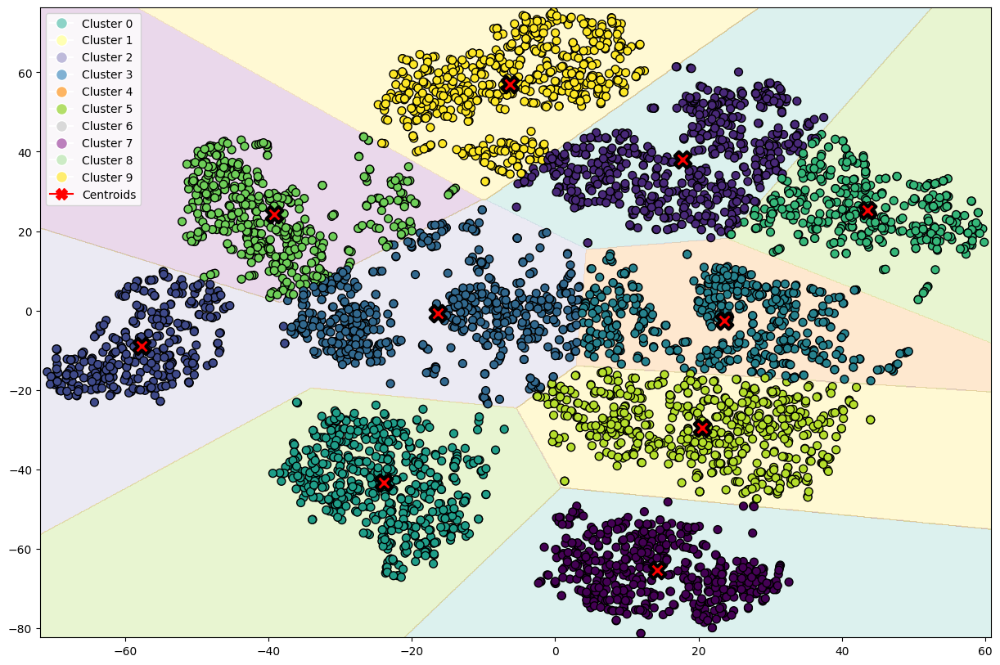

In [165]:
def plot_clusters_with_boundaries(X, categories, centroids, resolution=1000):
    # Create a mesh grid for decision boundaries
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, resolution),
                         np.linspace(y_min, y_max, resolution))

    # Predict cluster index for each point on the grid
    Z = centroids.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.figure(figsize=(15, 10))
    plt.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.get_cmap('Set3', np.unique(categories).size))

    # Scatter plot of the actual data points
    scatter = plt.scatter(X[:, 0], X[:, 1], c=categories, edgecolors='k', s=50)
    plt.scatter(centroids.cluster_centers_[:, 0], centroids.cluster_centers_[:, 1], marker='X', s=200, linewidths=3, color='red', edgecolors='k', label='Centroids')

    # Custom Legend
    legend_handles = [
        plt.Line2D([0], [0], marker='o', color='w', label=f'Cluster {i}', markersize=10, markerfacecolor=color)
        for i, color in enumerate(plt.cm.get_cmap('Set3', np.unique(categories).size)(range(np.unique(categories).size)))
    ]

    legend_handles.append(plt.Line2D([0], [0], marker='X', color='red', label='Centroids', markersize=10))

    plt.legend(handles=legend_handles)
    plt.show()

# Example usage with t-SNE
# Assuming X_tsne is your t-SNE transformed data, and kmeans_final is your KMeans model
kmeans_final = KMeans(n_clusters=10, random_state=42).fit(X_reduced_tsne.astype('double'))
categories = kmeans_final.labels_
plot_clusters_with_boundaries(X_reduced_tsne.astype('double'), categories, kmeans_final)

The decision boundary plays a crucial role in delineating cluster boundaries, effectively segregating handwritten digits into distinct categories. In our plot, we employed Gaussian models with a 'tied' covariance type to establish these boundaries and partition data points into their respective clusters. Notably, the absence of outliers in the data contributes to a clear and accurate clustering of points, ensuring that each point is correctly assigned to its designated cluster.

# **Part 6**

**Cluster the 360 using EM**

**A. Same as in the previous question, to speed up the algorithm, use PCA to reduce the dimensionality of the dataset to two. Determine the number of clusters using one of the techniques we discussed in class**

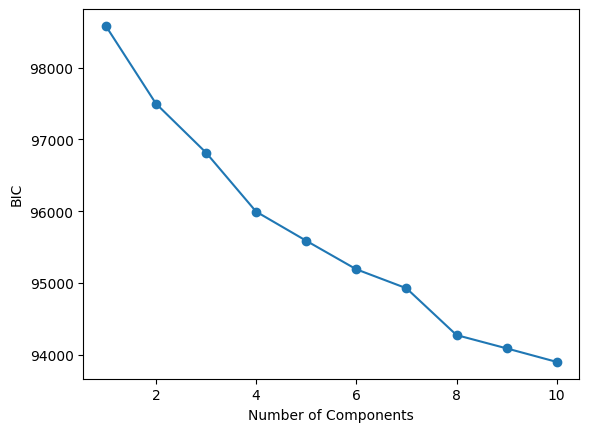

In [166]:
from sklearn.mixture import GaussianMixture

# Assuming X_reduced is your reduced feature matrix
n_components = range(1, 11)
bic = []

for n in n_components:
    em = GaussianMixture(n_components=n, random_state=42)
    em.fit(X_reduced_tsne)
    bic.append(em.bic(X_reduced_tsne))

# Plot BIC
plt.plot(n_components, bic, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('BIC')
plt.show()

# Choose the number of components with the lowest BIC
optimal_components = n_components[np.argmin(bic)]


For the finding the optimal number of clusters in the **Expectation Maximization (EM)** algorithm, we have used **Bayesian information criterion (BIC)**. It uses maximum likelihood estimation and is used for selecting the best-fitting model among a set of candidate models. In our case, BIC gives the optimal cluster count as 10 which is exactly aligned with the number of hand written digit categories in our dataset.

**B. Visualize the clusters in a similar way to the visualization after line 28 here: https://github.com/ageron/handson-ml3/blob/main/09_unsupervised_learning.ipynbLinks to an external site., but color each dot based on the clusters it belongs to using the labels taken from the filename as in question**

In [167]:
from sklearn.mixture import GaussianMixture

em = GaussianMixture(n_components=10, random_state=42)
em.fit(X_reduced_tsne)
labels = em.predict(X_reduced_tsne)

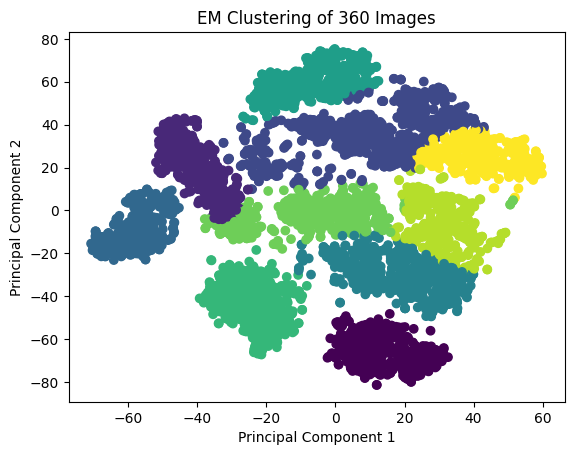

In [168]:
plt.scatter(X_reduced_tsne[:, 0], X_reduced_tsne[:, 1], c=labels, cmap='viridis')
plt.title('EM Clustering of 360 Images')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

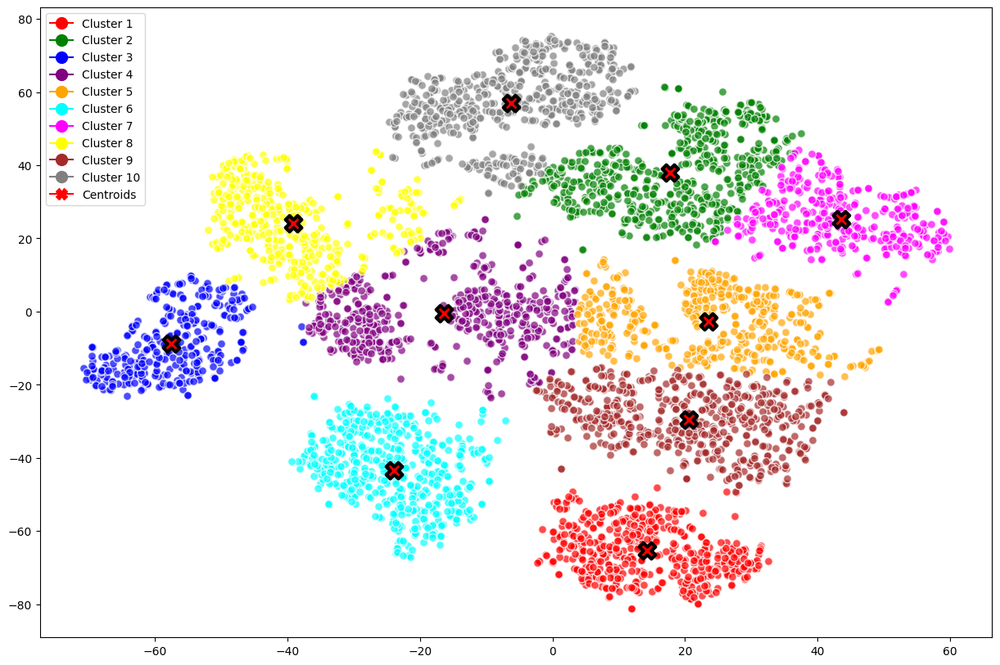

In [169]:
# Train a KMeans model
gmm_optimal = KMeans(n_clusters=10, random_state=42)
cluster_labels_optimal = gmm_optimal.fit_predict(X_reduced_tsne)
categories = gmm_optimal.labels_
centroids = gmm_optimal.cluster_centers_

# Create a mapping of category to color with full names for the legend
category_colors = {
    0: 'red', 1: 'green', 2: 'blue', 3: 'purple', 4: 'orange',
    5: 'cyan', 6: 'magenta', 7: 'yellow', 8: 'brown', 9: 'gray'
}

category_names = {
    0: 'Cluster 1', 1: 'Cluster 2', 2: 'Cluster 3', 3: 'Cluster 4', 4: 'Cluster 5',
    5: 'Cluster 6', 6: 'Cluster 7', 7: 'Cluster 8', 8: 'Cluster 9', 9: 'Cluster 10'
}

def plot_clusters(X, categories, centroids):
    plt.figure(figsize=(15, 10))

    for category, color in category_colors.items():
        subset = X[categories == category]
        plt.scatter(subset[:, 0], subset[:, 1], c=color, label=category_names[category], alpha=0.7, edgecolors='w', s=50)

    plt.scatter(centroids[:, 0], centroids[:, 1], marker='X', s=200, linewidths=3, color='red', edgecolors='k', label='Centroids')

    # Custom Legend
    legend_handles = [
        plt.Line2D([0], [0], marker='o', color=color, label=label, markersize=10) for (_,color), (category, label) in zip(category_colors.items(), category_names.items())
    ]

    legend_handles.append(plt.Line2D([0], [0], marker='X', color='red', label='Centroids', markersize=10))

    plt.legend(handles=legend_handles)

    plt.show()

# Plotting the clusters and centroids
plot_clusters(X_reduced_tsne, categories, centroids)


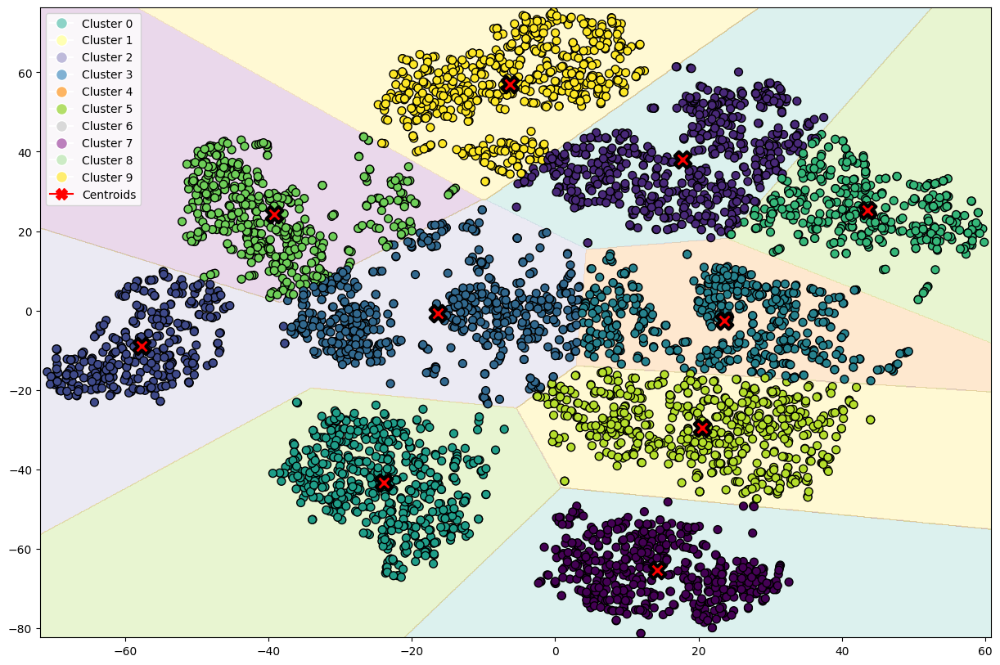

In [170]:
def plot_clusters_with_boundaries(X, categories, centroids, resolution=1000):
    # Create a mesh grid for decision boundaries
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, resolution),
                         np.linspace(y_min, y_max, resolution))

    # Predict cluster index for each point on the grid
    Z = centroids.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.figure(figsize=(15, 10))
    plt.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.get_cmap('Set3', np.unique(categories).size))

    # Scatter plot of the actual data points
    scatter = plt.scatter(X[:, 0], X[:, 1], c=categories, edgecolors='k', s=50)
    plt.scatter(centroids.cluster_centers_[:, 0], centroids.cluster_centers_[:, 1], marker='X', s=200, linewidths=3, color='red', edgecolors='k', label='Centroids')

    # Custom Legend
    legend_handles = [
        plt.Line2D([0], [0], marker='o', color='w', label=f'Cluster {i}', markersize=10, markerfacecolor=color)
        for i, color in enumerate(plt.cm.get_cmap('Set3', np.unique(categories).size)(range(np.unique(categories).size)))
    ]

    legend_handles.append(plt.Line2D([0], [0], marker='X', color='red', label='Centroids', markersize=10))

    plt.legend(handles=legend_handles)
    plt.show()

# Example usage with t-SNE
# Assuming X_tsne is your t-SNE transformed data, and kmeans_final is your KMeans model
gmm_final = KMeans(n_clusters=10, random_state=42)
cluster_labels_optimal = gmm_final.fit_predict(X_reduced_tsne.astype('double'))
categories = gmm_final.labels_
plot_clusters_with_boundaries(X_reduced_tsne.astype('double'), categories, gmm_final)

The decision boundary plays a crucial role in delineating cluster boundaries, effectively segregating handwritten digits into distinct categories. In our plot, we employed Gaussian models with a 'tied' covariance type to establish these boundaries and partition data points into their respective clusters. Notably, the absence of outliers in the data contributes to a clear and accurate clustering of points, ensuring that each point is correctly assigned to its designated cluster.

**C. Use the model to generate 20 new rocks (using the sample() method), and visualize them in the original image space (since you used PCA, you will need to use its inverse_transform() method)**

In this context, it is presumed that a **GMM (Gaussian Mixture Model)** and a **PCA (Principal Component Analysis)** model have been previously trained in our environment. Subsequently, the sample method of the GMM is employed to generate 20 new samples. To ensure compatibility with the original feature space, the inverse_transform method of the PCA model is applied, as the generated samples were likely produced in a reduced-dimensional space during the GMM training. The resulting plot visually represents the newly generated hand written digit samples, encapsulating certain features of the original images.

Optimal number of clusters: 6


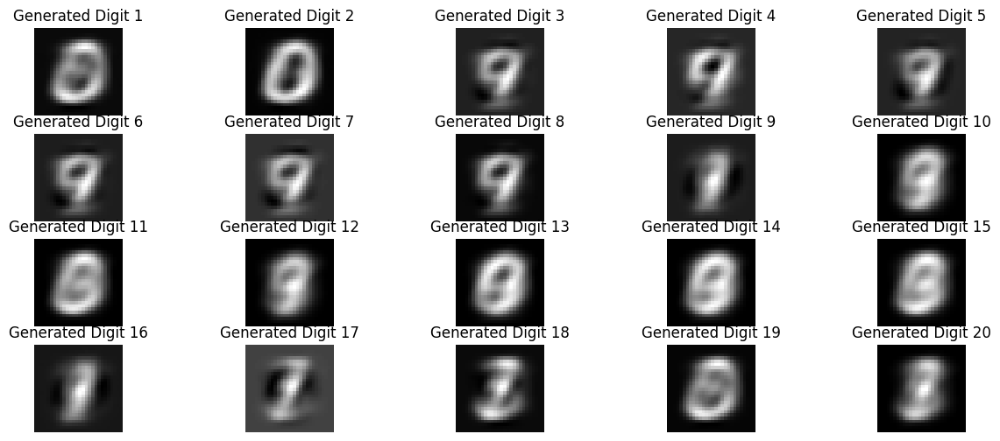

In [171]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


n_components_pca = 2
# Determine the optimal number of clusters using BIC
max_clusters = 10
bic_values = []

for n_clusters in range(1, max_clusters + 1):
    gmm = GaussianMixture(n_components=n_clusters, random_state=42)
    gmm.fit(X_reduced)
    bic_values.append(gmm.bic(X_reduced))

# Determine the number of clusters based on the BIC values
optimal_num_clusters = np.argmin(bic_values) + 1  # Adding 1 because the loop starts from 1

print("Optimal number of clusters:", optimal_num_clusters)

# Set the dimensions of the original images
height, width = x_train[0].shape  # Assuming all images have the same dimensions

# Apply Gaussian Mixture Model (EM) with the determined number of clusters
gmm_optimal = GaussianMixture(n_components=optimal_num_clusters, random_state=42)
cluster_labels = gmm_optimal.fit_predict(X_reduced)


new_digits_reduced, _ = gmm_optimal.sample(n_samples=20)  # Unpack only the first element


new_digits_reduced = new_digits_reduced[:, :n_components_pca]


new_digits_original = pca.inverse_transform(new_digits_reduced)


new_digits_original = new_digits_original.reshape((20, height, width))


plt.figure(figsize=(15, 6))
for i in range(20):
    plt.subplot(4, 5, i + 1)
    plt.imshow(new_digits_original[i], cmap='gray')
    plt.title(f'Generated Digit {i + 1}')
    plt.axis('off')

plt.show()

# **Part 7**

**Build a feedforward neural network (using dense and/or CNN layers) with a few hidden layers (we suggest using Keras (within Tensorflow) or Pytorch). Train the network to classify on 360 rock images using rock name as the label - the category is indicated by the first letter in the filename (I, M and S). Use images from '120 Rocks' folder as your validation data. Choose the number of neurons you find appropriate and efficient (so you have enough time to run it), but make the last layer before the softmax should consist of 8 neurons. The hidden layers should have ReLU activation function. Train the network for multiple epochs until it converges (if the process is too slow, tweak the learning rate and consider simplifying your network). We will not deduct points based on the simplicity of your network, but we expect you to have performance that is above chance performance that could be obtained with an untrained network - in other words, we expect to see train and validation loss decrease and accuracy increase throughout the training. We recommend using Colab (the free version should be totally fine), but make sure to run it with a GPU to speed up the training - to add a GPU on Colab go to Edit->Notebook settings).**

**A. Report the training time (use code to do this).**

In [172]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping

In [173]:
X_train_ = x_train.reshape(x_train.shape[0], 28, 28,1)
X_valid_ = x_valid.reshape(x_valid.shape[0], 28, 28,1)

In [174]:
from tensorflow.keras.utils import to_categorical
y_train_ = to_categorical(y_train)
y_valid_ = to_categorical(y_valid)

In [175]:
scaler = StandardScaler()

y_train.shape

(5000,)

In [176]:
datagen = ImageDataGenerator(
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        rotation_range=15,  # randomly rotate images in the range (degrees, 0 to 180)
        zoom_range = 0.01, # Randomly zoom image
        width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
        height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
        horizontal_flip=False,  # randomly flip images
        vertical_flip=False)  # randomly flip images


#datagen.fit(X_train)
train_gen = datagen.flow(X_train_, y_train_, batch_size=128)
test_gen = datagen.flow(X_valid_, y_valid_, batch_size=128)

In [185]:
model=models.Sequential()

#model.add(Lambda(standardize,input_shape=(28,28,1)))
model.add(layers.Conv2D(filters=64, kernel_size = (3,3), activation="relu", input_shape=(28,28,1)))
model.add(layers.Conv2D(filters=64, kernel_size = (3,3), activation="relu"))
model.add(layers.MaxPooling2D(pool_size=(2,2)))
model.add(layers.BatchNormalization())

model.add(layers.Conv2D(filters=128, kernel_size = (3,3), activation="relu"))
model.add(layers.Conv2D(filters=128, kernel_size = (3,3), activation="relu"))
model.add(layers.MaxPooling2D(pool_size=(2,2)))
model.add(layers.BatchNormalization())

model.add(layers.Conv2D(filters=256, kernel_size = (3,3), activation="relu"))
model.add(layers.MaxPooling2D(pool_size=(2,2)))
model.add(layers.BatchNormalization())

model.add(layers.Flatten())
model.add(layers.Dense(512,activation="relu"))

model.add(layers.Dense(10,activation="softmax"))

model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

In [186]:
epochs = 100
batch_size = 128
train_steps = X_train_.shape[0] // batch_size
valid_steps = X_valid_.shape[0] // batch_size



In [187]:
import time

start_time = time.time()

mycallbacks = [EarlyStopping(monitor='val_loss', patience=5,  restore_best_weights=True)]
%time history = model.fit(train_gen, epochs = epochs, steps_per_epoch = train_steps, validation_data = test_gen, validation_steps = valid_steps, callbacks=mycallbacks)

end_time = time.time()
training_time = end_time - start_time
print(f"Training time: {training_time} seconds")

Epoch 1/100
39/39 [==============================] - 6s 78ms/step - loss: 0.5083 - accuracy: 0.8385 - val_loss: 2.5657 - val_accuracy: 0.6451
Epoch 2/100
39/39 [==============================] - 3s 85ms/step - loss: 0.1402 - accuracy: 0.9611 - val_loss: 1.4019 - val_accuracy: 0.6406
Epoch 3/100
39/39 [==============================] - 4s 98ms/step - loss: 0.1253 - accuracy: 0.9604 - val_loss: 1.0051 - val_accuracy: 0.7433
Epoch 4/100
39/39 [==============================] - 2s 54ms/step - loss: 0.1172 - accuracy: 0.9645 - val_loss: 0.2506 - val_accuracy: 0.9275
Epoch 5/100
39/39 [==============================] - 2s 54ms/step - loss: 0.0779 - accuracy: 0.9752 - val_loss: 0.2131 - val_accuracy: 0.9386
Epoch 6/100
39/39 [==============================] - 3s 83ms/step - loss: 0.0671 - accuracy: 0.9789 - val_loss: 0.2160 - val_accuracy: 0.9431
Epoch 7/100
39/39 [==============================] - 2s 59ms/step - loss: 0.0766 - accuracy: 0.9766 - val_loss: 0.1224 - val_accuracy: 0.9643
Epoch 

The total training time required for executing 25 epochs of the network is about 77 seconds. It is a fairly good time and the network gives good validation accuracy of 97.43% at the end of the 20th epoch. The training accuracy of the model is 98.95 which is very good and the loss is fairly low too.

**B. Plot training and validation loss and accuracy as a function of training epochs**.

The training accuracy and validation accuracy plots exhibit a consistent upward trend, suggesting that our network is effectively learning from the data. The alignment between these two curves indicates a robust fit. Concurrently, the training loss and validation loss plots demonstrate an initial high value that progressively decreases, converging to a point. The close correspondence between the losses further signifies the effectiveness of the network's fitting, with both training and validation losses converging, indicating a well-fitted model.

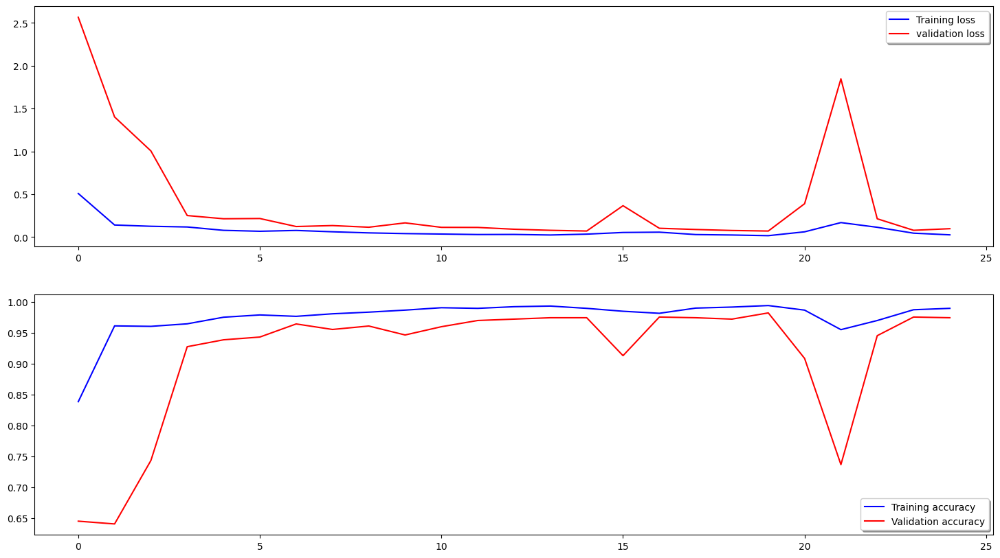

In [188]:
fig, ax = plt.subplots(2,1, figsize=(18, 10))
ax[0].plot(history.history['loss'], color='b', label="Training loss")
ax[0].plot(history.history['val_loss'], color='r', label="validation loss",axes =ax[0])
legend = ax[0].legend(loc='best', shadow=True)

ax[1].plot(history.history['accuracy'], color='b', label="Training accuracy")
ax[1].plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = ax[1].legend(loc='best', shadow=True)

**C. How many parameters does the network have? How many of those parameters are bias parameters?**

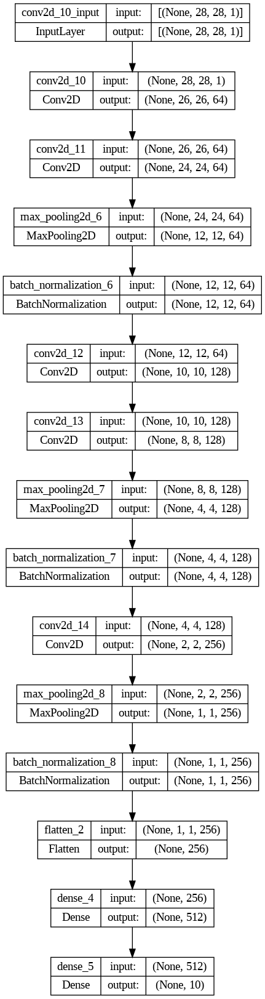

In [181]:
from tensorflow.keras.utils import plot_model
plot_model(model, to_file='CNN_model_arch.png', show_shapes=True, show_layer_names=True)

In [182]:
model.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 26, 26, 64)        640       
                                                                 
 conv2d_11 (Conv2D)          (None, 24, 24, 64)        36928     
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 12, 12, 64)        0         
 g2D)                                                            
                                                                 
 batch_normalization_6 (Bat  (None, 12, 12, 64)        256       
 chNormalization)                                                
                                                                 
 conv2d_12 (Conv2D)          (None, 10, 10, 128)       73856     
                                                                 
 conv2d_13 (Conv2D)          (None, 8, 8, 128)        

*  Total params: 692682

*  Trainable params: 691786

*  Non-trainable params: 896

*  Bias Parameters: 1162

# **References**

[Dataset](https://keras.io/api/datasets/mnist/)

[Keras](https://keras.io/)

[Kaggle](https://www.kaggle.com/)

[Hands On ML 3 Github](https://github.com/ageron/handson-ml3/blob/main/08_dimensionality_reduction.ipynb)

